In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/uber-fares-dataset/uber.csv


In [4]:
df = pd.read_csv('/kaggle/input/uber-fares-dataset/uber.csv')
df

,Unnamed: 0,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,24238194,2015-05-07 19:52:06.0000003,7.5,2015-05-07 19:52:06 UTC,-73.999817,40.738354,-73.999512,40.723217,1
1,27835199,2009-07-17 20:04:56.0000002,7.7,2009-07-17 20:04:56 UTC,-73.994355,40.728225,-73.994710,40.750325,1
2,44984355,2009-08-24 21:45:00.00000061,12.9,2009-08-24 21:45:00 UTC,-74.005043,40.740770,-73.962565,40.772647,1
3,25894730,2009-06-26 08:22:21.0000001,5.3,2009-06-26 08:22:21 UTC,-73.976124,40.790844,-73.965316,40.803349,3
4,17610152,2014-08-28 17:47:00.000000188,16.0,2014-08-28 17:47:00 UTC,-73.925023,40.744085,-73.973082,40.761247,5
...,...,...,...,...,...,...,...,...,...
199995,42598914,2012-10-28 10:49:00.00000053,3.0,2012-10-28 10:49:00 UTC,-73.987042,40.739367,-73.986525,40.740297,1
199996,16382965,2014-03-14 01:09:00.0000008,7.5,2014-03-14 01:09:00 UTC,-73.984722,40.736837,-74.006672,40.739620,1
199997,27804658,2009-06-29 00:42:00.00000078,30.9,2009-06-29 00:42:00 UTC,-73.986017,40.756487,-73.858957,40.692588,2
199998,20259894,2015-05-20 14:56:25.0000004,14.5,2015-05-20 14:56:25 UTC,-73.997124,40.725452,-73.983215,40.695415,1


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 9 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Unnamed: 0         200000 non-null  int64  
 1   key                200000 non-null  object 
 2   fare_amount        200000 non-null  float64
 3   pickup_datetime    200000 non-null  object 
 4   pickup_longitude   200000 non-null  float64
 5   pickup_latitude    200000 non-null  float64
 6   dropoff_longitude  199999 non-null  float64
 7   dropoff_latitude   199999 non-null  float64
 8   passenger_count    200000 non-null  int64  
dtypes: float64(5), int64(2), object(2)
memory usage: 13.7+ MB


In [6]:
df.drop(['Unnamed: 0','key'],axis=1,inplace=True)

In [7]:
df

,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,7.5,2015-05-07 19:52:06 UTC,-73.999817,40.738354,-73.999512,40.723217,1
1,7.7,2009-07-17 20:04:56 UTC,-73.994355,40.728225,-73.994710,40.750325,1
2,12.9,2009-08-24 21:45:00 UTC,-74.005043,40.740770,-73.962565,40.772647,1
3,5.3,2009-06-26 08:22:21 UTC,-73.976124,40.790844,-73.965316,40.803349,3
4,16.0,2014-08-28 17:47:00 UTC,-73.925023,40.744085,-73.973082,40.761247,5
...,...,...,...,...,...,...,...
199995,3.0,2012-10-28 10:49:00 UTC,-73.987042,40.739367,-73.986525,40.740297,1
199996,7.5,2014-03-14 01:09:00 UTC,-73.984722,40.736837,-74.006672,40.739620,1
199997,30.9,2009-06-29 00:42:00 UTC,-73.986017,40.756487,-73.858957,40.692588,2
199998,14.5,2015-05-20 14:56:25 UTC,-73.997124,40.725452,-73.983215,40.695415,1


In [8]:
df['pickup_datetime'] = pd.to_datetime(df['pickup_datetime'])

In [9]:
df['hour'] = df['pickup_datetime'].dt.hour
df['day'] = df['pickup_datetime'].dt.day
df['weekday'] = df['pickup_datetime'].dt.weekday
df['month'] = df['pickup_datetime'].dt.month
df['year'] = df['pickup_datetime'].dt.year

In [10]:
df.drop('pickup_datetime',axis=1,inplace=True)

In [11]:
df

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,weekday,month,year
0,7.5,-73.999817,40.738354,-73.999512,40.723217,1,19,7,3,5,2015
1,7.7,-73.994355,40.728225,-73.994710,40.750325,1,20,17,4,7,2009
2,12.9,-74.005043,40.740770,-73.962565,40.772647,1,21,24,0,8,2009
3,5.3,-73.976124,40.790844,-73.965316,40.803349,3,8,26,4,6,2009
4,16.0,-73.925023,40.744085,-73.973082,40.761247,5,17,28,3,8,2014
...,...,...,...,...,...,...,...,...,...,...,...
199995,3.0,-73.987042,40.739367,-73.986525,40.740297,1,10,28,6,10,2012
199996,7.5,-73.984722,40.736837,-74.006672,40.739620,1,1,14,4,3,2014
199997,30.9,-73.986017,40.756487,-73.858957,40.692588,2,0,29,0,6,2009
199998,14.5,-73.997124,40.725452,-73.983215,40.695415,1,14,20,2,5,2015


In [12]:
def filter_latitude(x):
  if x < -90 or x > 90:
    return np.nan
  else:
    return x

In [13]:
def filter_longitude(x):
  if x < -180 or x > 180:
    return np.nan
  else:
    return x

In [14]:
df['pickup_latitude'] = df['pickup_latitude'].apply(filter_latitude)
df['pickup_longitude'] = df['pickup_longitude'].apply(filter_longitude)
df['dropoff_latitude'] = df['dropoff_latitude'].apply(filter_latitude)
df['dropoff_longitude'] = df['dropoff_longitude'].apply(filter_longitude)

In [15]:
df

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,weekday,month,year
0,7.5,-73.999817,40.738354,-73.999512,40.723217,1,19,7,3,5,2015
1,7.7,-73.994355,40.728225,-73.994710,40.750325,1,20,17,4,7,2009
2,12.9,-74.005043,40.740770,-73.962565,40.772647,1,21,24,0,8,2009
3,5.3,-73.976124,40.790844,-73.965316,40.803349,3,8,26,4,6,2009
4,16.0,-73.925023,40.744085,-73.973082,40.761247,5,17,28,3,8,2014
...,...,...,...,...,...,...,...,...,...,...,...
199995,3.0,-73.987042,40.739367,-73.986525,40.740297,1,10,28,6,10,2012
199996,7.5,-73.984722,40.736837,-74.006672,40.739620,1,1,14,4,3,2014
199997,30.9,-73.986017,40.756487,-73.858957,40.692588,2,0,29,0,6,2009
199998,14.5,-73.997124,40.725452,-73.983215,40.695415,1,14,20,2,5,2015


In [16]:
df.isnull().sum()

fare_amount          0
pickup_longitude     7
pickup_latitude      4
dropoff_longitude    4
dropoff_latitude     4
passenger_count      0
hour                 0
day                  0
weekday              0
month                0
year                 0
dtype: int64

In [17]:
df.dropna(inplace=True)

In [18]:
df

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,weekday,month,year
0,7.5,-73.999817,40.738354,-73.999512,40.723217,1,19,7,3,5,2015
1,7.7,-73.994355,40.728225,-73.994710,40.750325,1,20,17,4,7,2009
2,12.9,-74.005043,40.740770,-73.962565,40.772647,1,21,24,0,8,2009
3,5.3,-73.976124,40.790844,-73.965316,40.803349,3,8,26,4,6,2009
4,16.0,-73.925023,40.744085,-73.973082,40.761247,5,17,28,3,8,2014
...,...,...,...,...,...,...,...,...,...,...,...
199995,3.0,-73.987042,40.739367,-73.986525,40.740297,1,10,28,6,10,2012
199996,7.5,-73.984722,40.736837,-74.006672,40.739620,1,1,14,4,3,2014
199997,30.9,-73.986017,40.756487,-73.858957,40.692588,2,0,29,0,6,2009
199998,14.5,-73.997124,40.725452,-73.983215,40.695415,1,14,20,2,5,2015


In [19]:
from math import cos, asin, sqrt
def distance_km(lat1, lon1, lat2, lon2):
    R = 6371 # Bán kính trái đất (km)
    p = np.pi/180 # giá trị pi/180
    a = 0.5 - cos((lat2 - lat1) * p)/2 + cos(lat1 * p) * cos(lat2 * p) * (1 - cos((lon2 - lon1) * p)) / 2
    return 2*R*asin(sqrt(a)) 

In [20]:
df['distance_km'] = df.apply(lambda x: distance_km(x['pickup_latitude'],
                                                   x['pickup_longitude'],
                                                   x['dropoff_latitude'],
                                                   x['dropoff_longitude']), axis=1)

In [21]:
df

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,weekday,month,year,distance_km
0,7.5,-73.999817,40.738354,-73.999512,40.723217,1,19,7,3,5,2015,1.683323
1,7.7,-73.994355,40.728225,-73.994710,40.750325,1,20,17,4,7,2009,2.457590
2,12.9,-74.005043,40.740770,-73.962565,40.772647,1,21,24,0,8,2009,5.036377
3,5.3,-73.976124,40.790844,-73.965316,40.803349,3,8,26,4,6,2009,1.661683
4,16.0,-73.925023,40.744085,-73.973082,40.761247,5,17,28,3,8,2014,4.475450
...,...,...,...,...,...,...,...,...,...,...,...,...
199995,3.0,-73.987042,40.739367,-73.986525,40.740297,1,10,28,6,10,2012,0.112210
199996,7.5,-73.984722,40.736837,-74.006672,40.739620,1,1,14,4,3,2014,1.875050
199997,30.9,-73.986017,40.756487,-73.858957,40.692588,2,0,29,0,6,2009,12.850319
199998,14.5,-73.997124,40.725452,-73.983215,40.695415,1,14,20,2,5,2015,3.539715


In [22]:
df.drop(['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude'], axis=1, inplace=True)

In [23]:
df

,fare_amount,passenger_count,hour,day,weekday,month,year,distance_km
0,7.5,1,19,7,3,5,2015,1.683323
1,7.7,1,20,17,4,7,2009,2.457590
2,12.9,1,21,24,0,8,2009,5.036377
3,5.3,3,8,26,4,6,2009,1.661683
4,16.0,5,17,28,3,8,2014,4.475450
...,...,...,...,...,...,...,...,...
199995,3.0,1,10,28,6,10,2012,0.112210
199996,7.5,1,1,14,4,3,2014,1.875050
199997,30.9,2,0,29,0,6,2009,12.850319
199998,14.5,1,14,20,2,5,2015,3.539715


In [24]:
df.describe()

,fare_amount,passenger_count,hour,day,weekday,month,year,distance_km
count,199987.000000,199987.000000,199987.000000,199987.000000,199987.000000,199987.000000,199987.000000,199987.000000
mean,11.359849,1.684544,13.491562,15.704736,3.048383,6.281783,2011.742463,20.560330
std,9.901868,1.385999,6.515458,8.687469,1.946960,3.438957,1.856438,379.620738
min,-52.000000,0.000000,0.000000,1.000000,0.000000,1.000000,2009.000000,0.000000
25%,6.000000,1.000000,9.000000,8.000000,1.000000,3.000000,2010.000000,1.215167
50%,8.500000,1.000000,14.000000,16.000000,3.000000,6.000000,2012.000000,2.120825
75%,12.500000,2.000000,19.000000,23.000000,5.000000,9.000000,2013.000000,3.874779
max,499.000000,208.000000,23.000000,31.000000,6.000000,12.000000,2015.000000,8782.898606


In [25]:
df[df['fare_amount']<=0] # wrong fare_amount

,fare_amount,passenger_count,hour,day,weekday,month,year,distance_km
20744,0.00,1,23,22,2,4,2015,0.000000
22182,0.00,2,2,20,5,3,2010,11.065289
63395,-5.00,1,23,3,1,3,2015,0.325306
71246,-3.30,2,21,11,3,2,2010,0.500646
79903,-3.50,1,14,1,4,5,2015,0.383918
87467,0.00,2,3,4,6,1,2015,8665.983754
89322,-49.57,5,8,9,1,3,2010,0.019203
92063,-23.70,3,8,12,4,3,2010,8.171296
98875,-52.00,5,21,20,4,3,2015,0.450054
104080,-7.30,1,20,9,1,3,2010,1.997243


In [26]:
df[df['distance_km']==0] # wrong distance

,fare_amount,passenger_count,hour,day,weekday,month,year,distance_km
5,4.9,1,2,12,5,2,2011,0.0
7,2.5,1,13,11,1,12,2012,0.0
11,8.5,1,22,23,0,5,2011,0.0
48,56.8,1,22,3,3,1,2013,0.0
65,6.0,1,19,5,0,5,2014,0.0
...,...,...,...,...,...,...,...,...
199880,6.5,1,6,22,5,2,2014,0.0
199883,12.5,2,17,10,0,9,2012,0.0
199917,4.5,1,22,24,0,6,2013,0.0
199932,24.9,5,13,22,1,3,2011,0.0


In [27]:
df.drop(df[df['fare_amount']<=0].index,inplace=True)
df.drop(df[df['distance_km']==0].index,inplace=True)

In [28]:
df

,fare_amount,passenger_count,hour,day,weekday,month,year,distance_km
0,7.5,1,19,7,3,5,2015,1.683323
1,7.7,1,20,17,4,7,2009,2.457590
2,12.9,1,21,24,0,8,2009,5.036377
3,5.3,3,8,26,4,6,2009,1.661683
4,16.0,5,17,28,3,8,2014,4.475450
...,...,...,...,...,...,...,...,...
199995,3.0,1,10,28,6,10,2012,0.112210
199996,7.5,1,1,14,4,3,2014,1.875050
199997,30.9,2,0,29,0,6,2009,12.850319
199998,14.5,1,14,20,2,5,2015,3.539715


In [29]:
df[df['distance_km'] > 100]

,fare_amount,passenger_count,hour,day,weekday,month,year,distance_km
346,15.5,1,19,5,3,3,2015,8666.398012
1067,52.0,1,22,2,6,2,2014,8647.035598
1526,2.5,3,12,12,0,5,2014,8666.772408
1945,7.0,1,16,10,6,2,2013,6021.114289
2167,5.7,1,12,21,5,7,2012,5941.059801
...,...,...,...,...,...,...,...,...
197863,7.0,1,22,18,1,11,2014,8664.389119
198567,23.5,2,1,21,0,10,2013,8665.747167
198665,20.1,5,21,26,1,6,2012,4528.959683
199403,7.0,1,17,20,6,1,2013,565.234582


In [30]:
df.distance_km.quantile([0.8, 0.9, 0.95, 0.99, 0.995, 0.999])

0.800       4.637469
0.900       7.141500
0.950      10.216787
0.990      20.754958
0.995      22.045193
0.999    8665.433017
Name: distance_km, dtype: float64

In [31]:
df.drop(df[df['distance_km'] > 100].index, inplace=True)

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [33]:
px.box(df,y='distance_km')

In [34]:
px.histogram(df, x='distance_km')

In [35]:
px.scatter(df,x='distance_km', y='fare_amount')

In [36]:
px.box(df, y='fare_amount')

In [37]:
df.drop(df[df['fare_amount'] > 200].index, inplace=True)

In [38]:
df.drop(df[df['distance_km'] > 100].index, inplace=True)

In [39]:
df

,fare_amount,passenger_count,hour,day,weekday,month,year,distance_km
0,7.5,1,19,7,3,5,2015,1.683323
1,7.7,1,20,17,4,7,2009,2.457590
2,12.9,1,21,24,0,8,2009,5.036377
3,5.3,3,8,26,4,6,2009,1.661683
4,16.0,5,17,28,3,8,2014,4.475450
...,...,...,...,...,...,...,...,...
199995,3.0,1,10,28,6,10,2012,0.112210
199996,7.5,1,1,14,4,3,2014,1.875050
199997,30.9,2,0,29,0,6,2009,12.850319
199998,14.5,1,14,20,2,5,2015,3.539715


In [40]:
df.describe()

,fare_amount,passenger_count,hour,day,weekday,month,year,distance_km
count,193873.000000,193873.000000,193873.000000,193873.000000,193873.000000,193873.000000,193873.000000,193873.000000
mean,11.341566,1.684969,13.487876,15.705374,3.049001,6.281880,2011.745117,3.361030
std,9.633808,1.388565,6.515612,8.687840,1.946662,3.440533,1.860161,3.725054
min,0.010000,0.000000,0.000000,1.000000,0.000000,1.000000,2009.000000,0.000072
25%,6.000000,1.000000,9.000000,8.000000,1.000000,3.000000,2010.000000,1.279954
50%,8.500000,1.000000,14.000000,16.000000,3.000000,6.000000,2012.000000,2.179638
75%,12.500000,2.000000,19.000000,23.000000,5.000000,9.000000,2013.000000,3.937342
max,196.000000,208.000000,23.000000,31.000000,6.000000,12.000000,2015.000000,99.162509


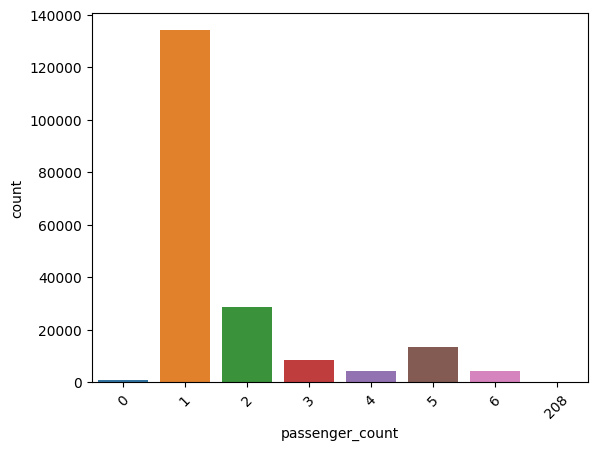

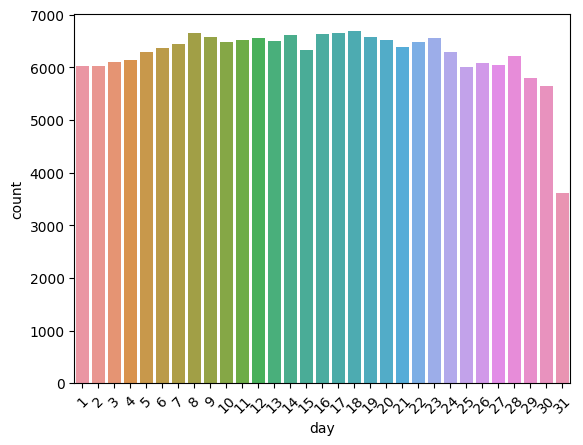

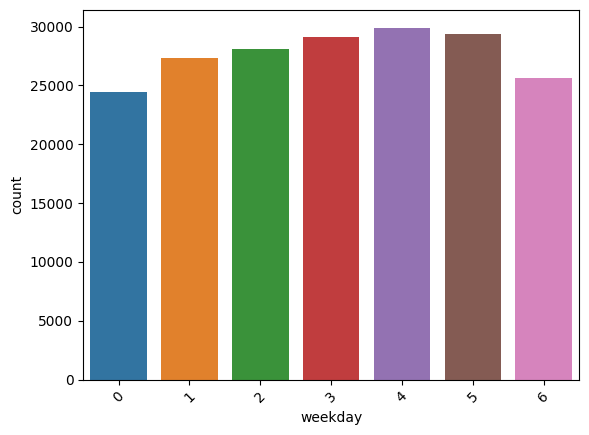

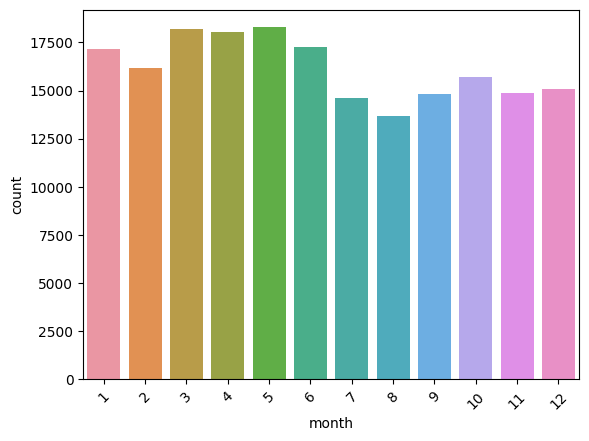

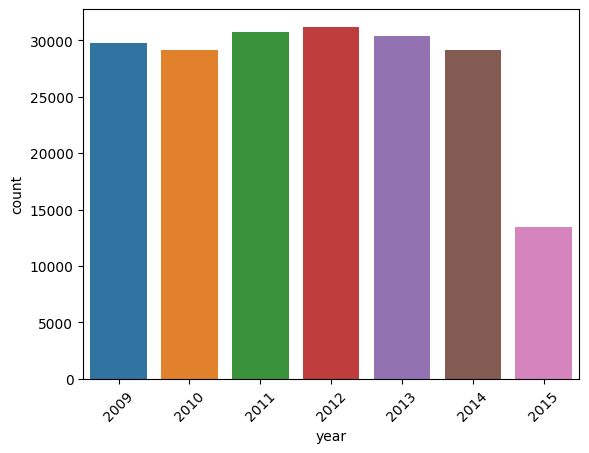

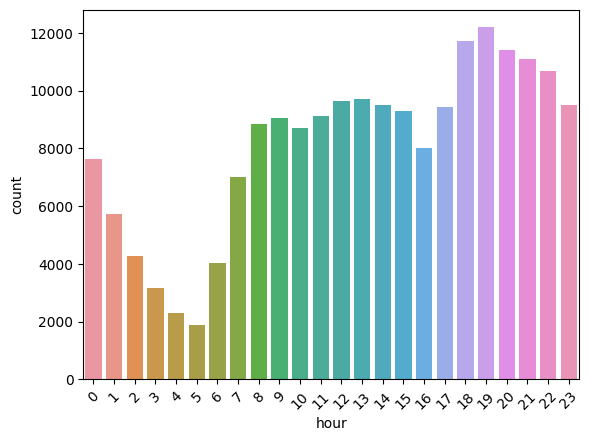

In [41]:
list_col = ['passenger_count','day','weekday','month','year','hour']

for col in list_col:
  sns.countplot(data=df,x=col)
  plt.xticks(rotation=45)
  plt.show()

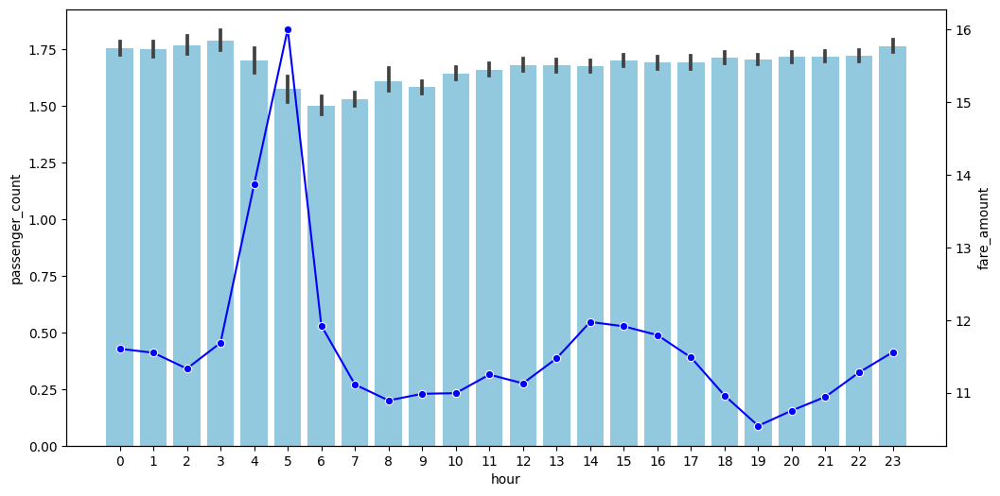

In [49]:
fig, ax1=plt.subplots(figsize=(12,6))
sns.color_palette("pastel")
sns.barplot(data=df,x='hour', y='passenger_count', color='skyblue', ax=ax1)
ax2 = ax1.twinx()
sns.lineplot(data=df,x='hour', y='fare_amount', errorbar=None, color='blue', marker='o', ax=ax2)
plt.show()

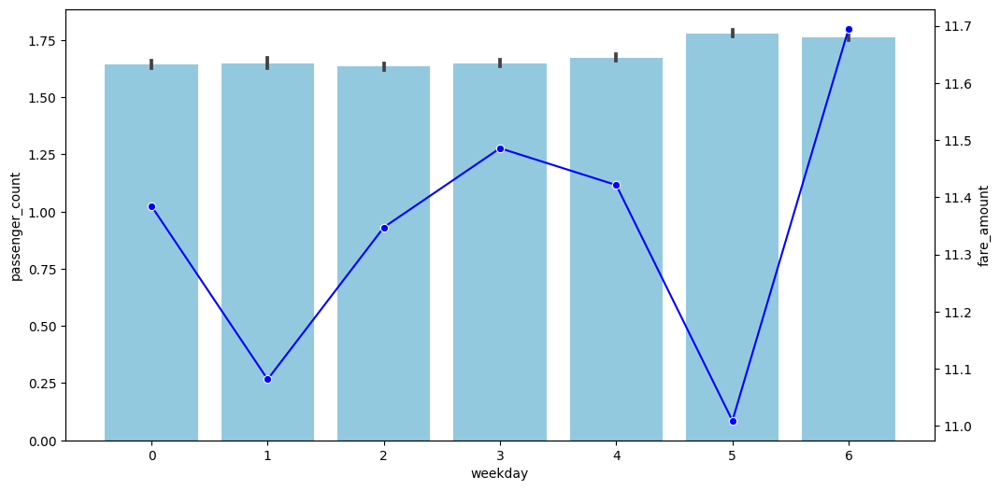

In [51]:
fig, ax1=plt.subplots(figsize=(12,6))
sns.color_palette("pastel")
sns.barplot(data=df,x='weekday', y='passenger_count', color='skyblue', ax=ax1)
ax2 = ax1.twinx()
sns.lineplot(data=df,x='weekday', y='fare_amount', errorbar=None, color='blue', marker='o', ax=ax2)
plt.show()

<Axes: >

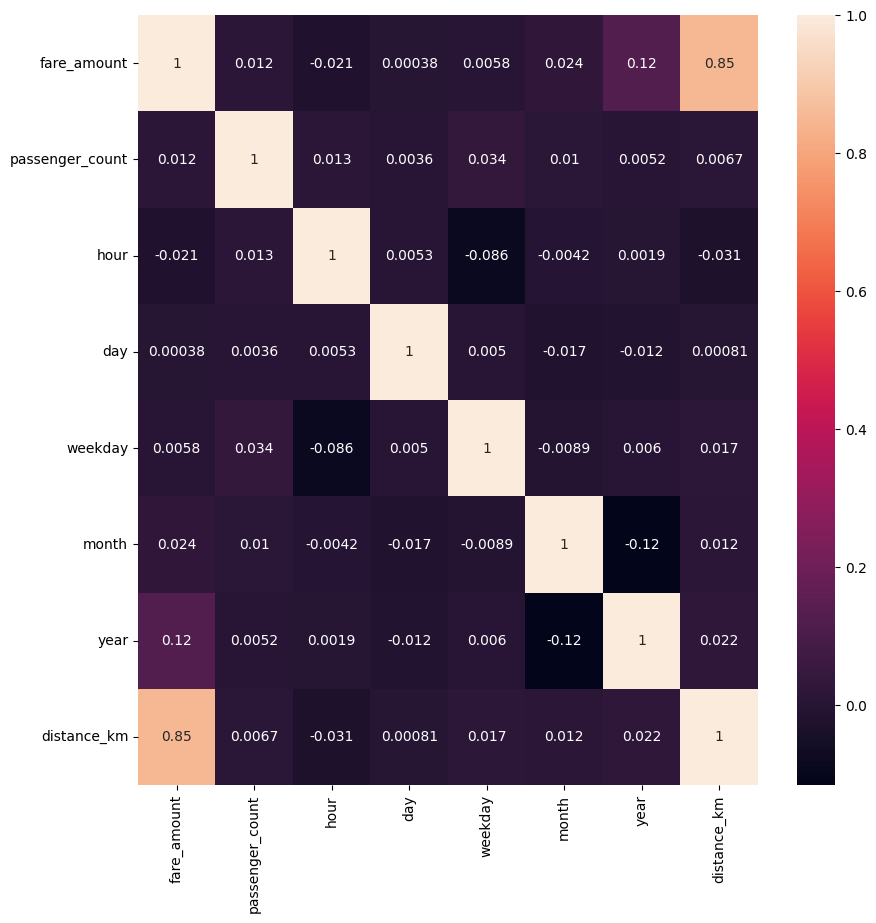

In [42]:
corr = df.corr()
plt.figure(figsize=(10,10))
sns.heatmap(corr,annot=True)

In [61]:
from statsmodels.formula.api import ols

In [62]:
f_passenger_count = 'passenger_count~distance_km+year+month+weekday+hour+day'
m_passenger_count = ols(formula=f_passenger_count,data=df).fit()
rsq_passenger_count = m_passenger_count.rsquared
vif_passenger_count = round(1/(1-rsq_passenger_count),2)

In [63]:
f_distance_km = 'distance_km~passenger_count+year+month+weekday+hour+day'
m_distance_km = ols(formula=f_distance_km,data=df).fit()
rsq_distance_km = m_distance_km.rsquared
vif_distance_km = round(1/(1-rsq_distance_km),2)

In [64]:
f_year = 'year~passenger_count+distance_km+month+weekday+hour+day'
m_year = ols(formula=f_year,data=df).fit()
rsq_year = m_year.rsquared
vif_year = round(1/(1-rsq_year),2)

In [65]:
f_month = 'month~passenger_count+distance_km+year+weekday+hour+day'
m_month = ols(formula=f_month,data=df).fit()
rsq_month = m_month.rsquared
vif_month = round(1/(1-rsq_month),2)

In [66]:
f_weekday = 'weekday~passenger_count+distance_km+year+month+hour+day'
m_weekday = ols(formula=f_weekday,data=df).fit()
rsq_weekday = m_weekday.rsquared
vif_weekday = round(1/(1-rsq_weekday),2)

In [67]:
f_day = 'day~passenger_count+distance_km+year+month+weekday+hour'
m_day = ols(formula=f_day,data=df).fit()
rsq_day = m_day.rsquared
vif_day = round(1/(1-rsq_day),2)

In [68]:
f_hour = 'hour~passenger_count+distance_km+year+month+weekday+day'
m_hour = ols(formula=f_hour,data=df).fit()
rsq_hour = m_hour.rsquared
vif_hour = round(1/(1-rsq_hour),2)

In [70]:
vif_dic = {'feature':['passenger_count','hour', 'day', 'weekday', 'month', 'year', 'distance_km'],'VIF':[vif_passenger_count, vif_hour, vif_day, vif_weekday, vif_month, vif_year, vif_distance_km]}

pd.DataFrame(data=vif_dic)

,feature,VIF
0,passenger_count,1.00
1,hour,1.01
2,day,1.00
3,weekday,1.01
4,month,1.01
5,year,1.01
6,distance_km,1.00


In [71]:
formula1 = 'fare_amount ~ passenger_count+distance_km+year+month+weekday+day+hour'
model = ols(formula=formula1,data=df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            fare_amount   R-squared:                       0.731
Model:                            OLS   Adj. R-squared:                  0.731
Method:                 Least Squares   F-statistic:                 7.509e+04
Date:                Thu, 09 Nov 2023   Prob (F-statistic):               0.00
Time:                        15:30:22   Log-Likelihood:            -5.8715e+05
No. Observations:              193873   AIC:                         1.174e+06
Df Residuals:                  193865   BIC:                         1.174e+06
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept       -1096.9810     12.373    -88.657      0.000   -1121.232   -1072.730
passenger_count     0.0428      0.008      5.234      0.000       0.027       0.059
distance_km         2.1870      0.003    716.613      0.000       2.181       2.193
year                0.5470      0.006     88.954      0.000       0.535       0.559
month               0.0744      0.003     22.381      0.000       0.068       0.081
weekday            -0.0421      0.006     -7.176      0.000      -0.054      -0.031
day                 0.0016      0.001      1.230      0.219      -0.001       0.004
hour                0.0064      0.002      3.648      0.000       0.003       0.010
==============================================================================
Omnibus:                   110130.956   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):       1079496272.493
Skew:                          -0.841   Prob(JB):                         0.00
Kurtosis:                     368.555   Cond. No.                     2.19e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.19e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [43]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

In [44]:
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df)
df_scaled = pd.DataFrame(df_scaled,columns=df.columns)
df_scaled

,fare_amount,passenger_count,hour,day,weekday,month,year,distance_km
0,0.038216,0.004808,0.826087,0.200000,0.500000,0.363636,1.000000,0.016975
1,0.039237,0.004808,0.869565,0.533333,0.666667,0.545455,0.000000,0.024783
2,0.065769,0.004808,0.913043,0.766667,0.000000,0.636364,0.000000,0.050788
3,0.026991,0.014423,0.347826,0.833333,0.666667,0.454545,0.000000,0.016756
4,0.081586,0.024038,0.739130,0.900000,0.500000,0.636364,0.833333,0.045132
...,...,...,...,...,...,...,...,...
193868,0.015256,0.004808,0.434783,0.900000,1.000000,0.818182,0.500000,0.001131
193869,0.038216,0.004808,0.043478,0.433333,0.666667,0.181818,0.833333,0.018908
193870,0.157610,0.009615,0.000000,0.933333,0.000000,0.454545,0.000000,0.129588
193871,0.073932,0.004808,0.608696,0.633333,0.333333,0.363636,1.000000,0.035695


In [45]:
X = df_scaled.drop('fare_amount',axis=1)
y = df_scaled['fare_amount']

In [46]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42 )

In [54]:
from sklearn.linear_model import LinearRegression 
lr = LinearRegression()
lr.fit(X_train, y_train)

# Model Evaluation
from sklearn.metrics import mean_squared_error, r2_score

# Predictions
y_pred = lr.predict(X_test)

# Model Evaluation
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R2:', r2_score(y_test, y_pred))

RMSE: 0.026123798802752778
R2: 0.7240020399520273


In [56]:
from sklearn.linear_model import Ridge 
r = Ridge()
r = r.fit(X_train , y_train)

y_pred_ridge = r.predict(X_test) 
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred_ridge)))
print('R2:', r2_score(y_test, y_pred_ridge))

RMSE: 0.026129668779565678
R2: 0.7238779933954543


In [57]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

pl = make_pipeline(PolynomialFeatures(degree=2) , Ridge())
pl.fit(X_train , y_train)
y_pred_poly = pl.predict(X_test)
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred_poly)))
print('R2:', r2_score(y_test, y_pred_poly))

RMSE: 0.023648486043645823
R2: 0.7738274486663601


In [60]:
from sklearn.tree import DecisionTreeRegressor

dt = DecisionTreeRegressor()

dt.fit(X_train, y_train)

print('Training Score: ', dt.score(X_train, y_train))
print('Testing Score: ', dt.score(X_test, y_test))

Training Score:  1.0
Testing Score:  0.6069368182479047
